In [1]:
import numpy as np

# 1. Matrix Multiplication

In [2]:
a1 = np.array([[1, 2], [3, 4]])

In [3]:
a2 = np.array([[1],[2]])

In [4]:
a1 @ a2

array([[ 5],
       [11]])

In [5]:
b1 = np.array([[1, -1], [1, 1]])

In [6]:
b2 = np.array([[1, 0], [1, 1]])

In [7]:
b1 @ b2

array([[ 0, -1],
       [ 2,  1]])

# 2. Linear Transformation of Images

In [8]:
def toRads(a):
    return a * np.pi/180

In [9]:
def rotate(matrix, a):
    a = toRads(a)
    rot_a = np.array([[np.cos(a), -np.sin(a)], [np.sin(a), np.cos(a)]])
    return matrix @ rot_a

In [10]:
import matplotlib.pyplot as plt

In [11]:
def plot(matrix):
    ax = plt.subplot(1, 1, 1)
    ax.plot(matrix[:, 0], matrix[:, 1], marker='o')
    ax.set_aspect('equal')
    plt.show()

# 2.1 Rotate Objects

In [26]:
A = np.array([[0, 0], [0, 2], [1, 1]])

In [30]:
rotated_A1 = rotate(A, 45)

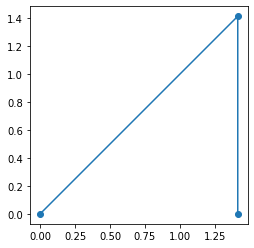

In [31]:
plot(rotated_A1)

In [32]:
rotated_A2 = rotate(A, -225)

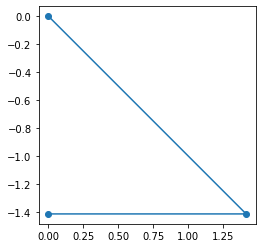

In [33]:
plot(rotated_A2)

In [34]:
rotated_A3 = rotate(A, 83)

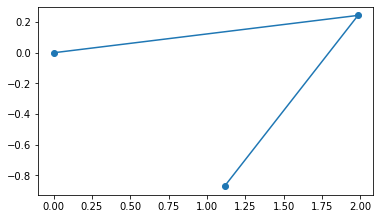

In [35]:
plot(rotated_A3)

In [42]:
obj = np.array([[0, 1], [3, 5], [4, 3], [2, 1]])
obj

array([[0, 1],
       [3, 5],
       [4, 3],
       [2, 1]])

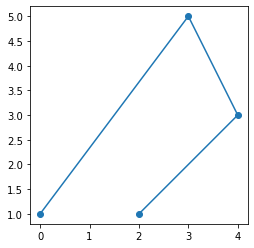

In [43]:
plot(obj)

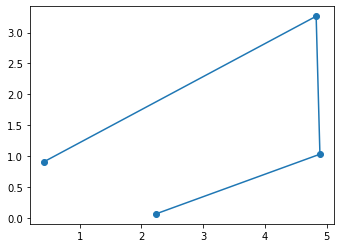

In [44]:
plot(rotate(obj, 25))

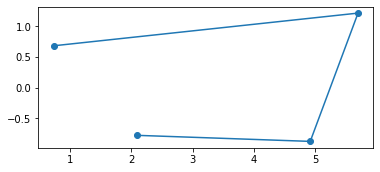

In [45]:
plot(rotate(obj, 47))

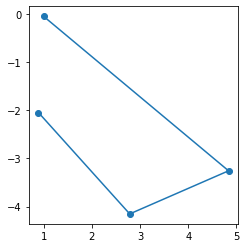

In [46]:
plot(rotate(obj, 93))

# 2.2 Rotate More Complex Images

In [47]:
import pandas as pd

In [49]:
data = pd.read_csv('./crazy-hat.tsv', '\t')

In [50]:
data.head()

,x,y,group
0,0,22,outline
1,16,-18,outline
2,-16,-18,outline
3,0,22,outline
4,-3,7,leye


In [66]:
data.group.unique()

array(['outline', 'leye', 'reye', 'mouth'], dtype=object)

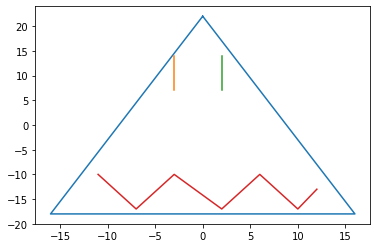

In [71]:
for g in data.group.unique():
    group = data[data['group'] == g]
    plt.plot(group.x, group.y)

In [107]:
def rotate_hat(a):
    new = rotate(data[['x', 'y']], a)
    data['new_x'] = new[0]
    data['new_y'] = new[1]
    return data

In [112]:
def plot_hat(a):
    rotate_hat(a)
    for g in data.group.unique():
        group = data[data['group'] == g]
        plt.plot(group.new_x, group.new_y)

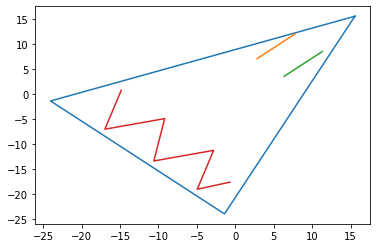

In [113]:
plot_hat(45)

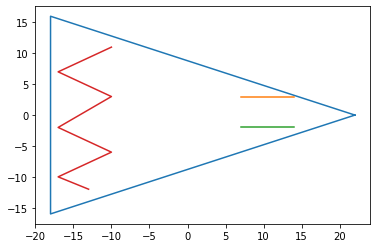

In [114]:
plot_hat(90)

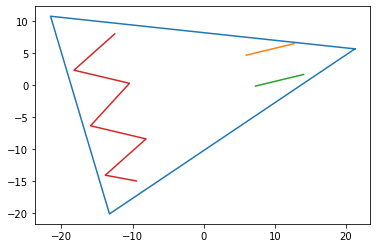

In [115]:
plot_hat(75)

# 2.3 Arbitrary Transformation

In [116]:
m = np.array([[2, 4], [5, 7]])

In [117]:
t = data[['x', 'y']] @ m

In [119]:
data['new_x'] = t[0]
data['new_y'] = t[1]

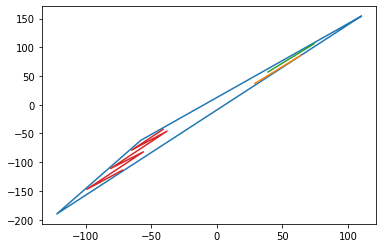

In [120]:
for g in data.group.unique():
        group = data[data['group'] == g]
        plt.plot(group.new_x, group.new_y)

# 3. Linear Regression

In [126]:
ds = pd.read_csv('./ccpp.csv.bz2', '\t')

In [127]:
ds.head()

,AT,V,AP,RH,PE
0,14.96,41.76,1024.07,73.17,463.26
1,25.18,62.96,1020.04,59.08,444.37
2,5.11,39.40,1012.16,92.14,488.56
3,20.86,57.32,1010.24,76.64,446.48
4,10.82,37.50,1009.23,96.62,473.90


## AT

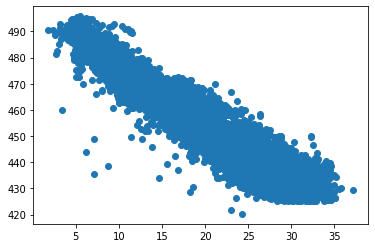

In [129]:
plt.scatter(ds.AT, ds.PE)

In [130]:
import statsmodels.formula.api as smf

In [131]:
r = smf.ols(formula = 'PE ~ AT', data=ds).fit()

In [132]:
r.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                     PE   R-squared:                       0.899
Model:                            OLS   Adj. R-squared:                  0.899
Method:                 Least Squares   F-statistic:                 8.510e+04
Date:                Mon, 10 Feb 2020   Prob (F-statistic):               0.00
Time:                        17:07:50   Log-Likelihood:                -29756.
No. Observations:                9568   AIC:                         5.952e+04
Df Residuals:                    9566   BIC:                         5.953e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    497.0341      0.156   3177.280      0.000     496.727     497.341
AT            -2.1713      0.007   -291.715      0.000      -2.186      -2.157
==============================================================================
Omnibus:                      417.457   Durbin-Watson:                   2.033
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1117.844
Skew:                          -0.209   Prob(JB):                    1.83e-243
Kurtosis:                       4.621   Cond. No.                         59.4
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

PE(AT) = 497.03 - 2.17 * AT + e

For every additional degree of temperature, the net energy output decreases by 2.17 MW. This is statistically significant due to the 0 p-value, indicating that there is almost a 0 probability that this relationship occurs purely due to chance

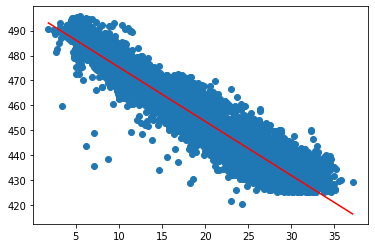

In [142]:
plt.scatter(ds.AT, ds.PE)
ax = np.linspace(ds['AT'].min(), ds['AT'].max())
hatPE = r.params[0] + r.params[1] * ax
plt.plot(ax, hatPE, color='red')
plt.show()

## AP

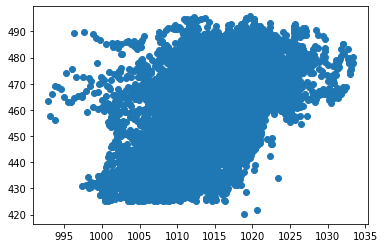

In [143]:
plt.scatter(ds.AP, ds.PE)

In [144]:
r = smf.ols(formula = 'PE ~ AP', data=ds).fit()

In [145]:
r.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                     PE   R-squared:                       0.269
Model:                            OLS   Adj. R-squared:                  0.269
Method:                 Least Squares   F-statistic:                     3516.
Date:                Mon, 10 Feb 2020   Prob (F-statistic):               0.00
Time:                        17:24:54   Log-Likelihood:                -39224.
No. Observations:                9568   AIC:                         7.845e+04
Df Residuals:                    9566   BIC:                         7.847e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept  -1055.2610     25.459    -41.449      0.000   -1105.167   -1005.355
AP             1.4899      0.025     59.296      0.000       1.441       1.539
==============================================================================
Omnibus:                      525.438   Durbin-Watson:                   1.996
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              612.290
Skew:                           0.616   Prob(JB):                    1.10e-133
Kurtosis:                       2.859   Cond. No.                     1.73e+05
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.73e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

PE(AP) = -1055.26 + 1.49 * AP + e

This means that for every additional millibar of ambient pressure, the energy output increases by 1.49 MW. This is statistically significant because the p-value is 0, meaning that there is almost no chance this relationship is due to chance

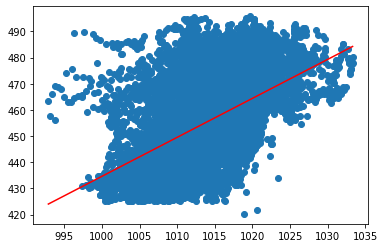

In [146]:
plt.scatter(ds.AP, ds.PE)
ax = np.linspace(ds['AP'].min(), ds['AP'].max())
hatPE = r.params[0] + r.params[1] * ax
plt.plot(ax, hatPE, color='red')
plt.show()

## RH

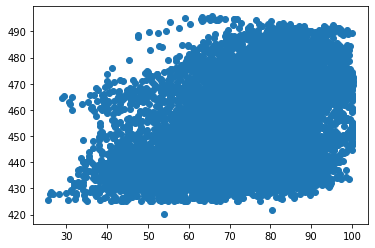

In [147]:
plt.scatter(ds.RH, ds.PE)

In [148]:
r = smf.ols(formula = 'PE ~ RH', data=ds).fit()

In [149]:
r.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                     PE   R-squared:                       0.152
Model:                            OLS   Adj. R-squared:                  0.152
Method:                 Least Squares   F-statistic:                     1714.
Date:                Mon, 10 Feb 2020   Prob (F-statistic):               0.00
Time:                        17:28:31   Log-Likelihood:                -39933.
No. Observations:                9568   AIC:                         7.987e+04
Df Residuals:                    9566   BIC:                         7.988e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    420.9618      0.823    511.676      0.000     419.349     422.574
RH             0.4557      0.011     41.399      0.000       0.434       0.477
==============================================================================
Omnibus:                      772.278   Durbin-Watson:                   1.998
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              319.245
Skew:                           0.231   Prob(JB):                     4.75e-70
Kurtosis:                       2.234   Cond. No.                         383.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

PE(RH) = 420.96 + 0.46 * RH + e

This means that for every additional percent of relative humidity, the net energy output increases by 0.46 MW. This is a statistically significant relationship because the p-value is close to 0, indicating that there is almost no chance this relationship is due to chance

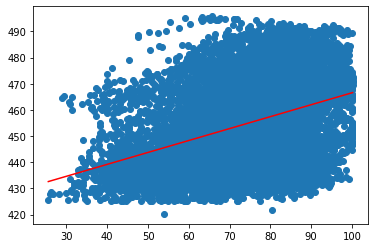

In [151]:
plt.scatter(ds.RH, ds.PE)
ax = np.linspace(ds['RH'].min(), ds['RH'].max())
hatPE = r.params[0] + r.params[1] * ax
plt.plot(ax, hatPE, color='red')
plt.show()

## V

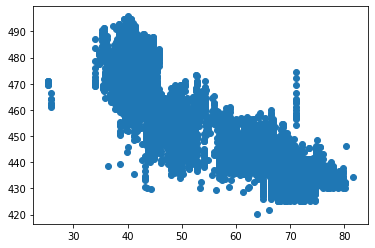

In [152]:
plt.scatter(ds.V, ds.PE)

In [153]:
r = smf.ols(formula = 'PE ~ V', data=ds).fit()

In [154]:
r.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                     PE   R-squared:                       0.757
Model:                            OLS   Adj. R-squared:                  0.756
Method:                 Least Squares   F-statistic:                 2.972e+04
Date:                Mon, 10 Feb 2020   Prob (F-statistic):               0.00
Time:                        17:31:30   Log-Likelihood:                -33963.
No. Observations:                9568   AIC:                         6.793e+04
Df Residuals:                    9566   BIC:                         6.794e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    517.8015      0.378   1370.218      0.000     517.061     518.542
V             -1.1681      0.007   -172.402      0.000      -1.181      -1.155
==============================================================================
Omnibus:                       77.693   Durbin-Watson:                   2.007
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              109.571
Skew:                          -0.097   Prob(JB):                     1.61e-24
Kurtosis:                       3.487   Cond. No.                         245.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

PE(V) = 517.8 - 1.17 * V + e

This means that for every additional cm Hg of exhaust vacuum, there is 1.17 MW less energy output. This relationship is statistically significant because the P value is 0, indicating that there is almost no chance the relationship is random.

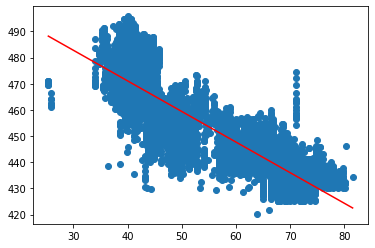

In [155]:
plt.scatter(ds.V, ds.PE)
ax = np.linspace(ds['V'].min(), ds['V'].max())
hatPE = r.params[0] + r.params[1] * ax
plt.plot(ax, hatPE, color='red')
plt.show()